In [8]:
import pandas as pd 
import numpy as np
import scipy as scp
import matplotlib as mlp
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn import preprocessing

In [17]:

file1='Filtered.csv'
dataframe=pd.read_csv(file1)
df=dataframe.drop(['Unnamed: 0'],1)
#print(df.columns,df.shape)

df.head()

,lat,lon,bhk,city,type,rate,source,airport1,airport3,airport5,...,subway_station1,subway_station3,subway_station5,train_station1,train_station3,train_station5,university1,university3,university5,city1
0,10.000341,76.284348,2.0,66,0,4500.0,1,0,2,2,...,0,0,0,5,8,18,2,31,56,2
1,10.000341,76.284348,2.0,66,0,4500.0,1,0,2,2,...,0,0,0,5,8,18,2,31,56,2
2,10.000341,76.284348,3.0,66,0,4500.0,1,0,2,2,...,0,0,0,5,8,18,2,31,56,2
3,10.000341,76.284348,2.0,66,0,4500.0,1,0,2,2,...,0,0,0,5,8,18,2,31,56,2
4,10.000341,76.284348,3.0,66,0,4500.0,1,0,2,2,...,0,0,0,5,8,18,2,31,56,2


In [18]:
#PlotWithOutlier


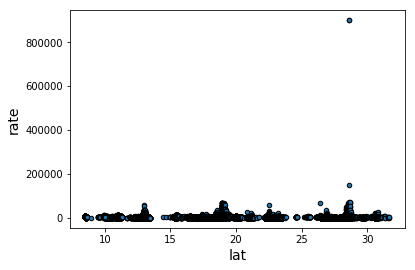

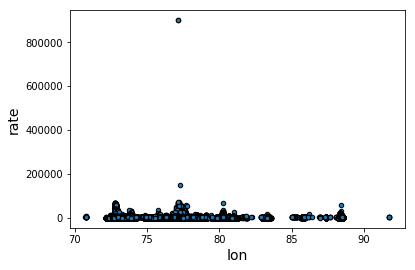

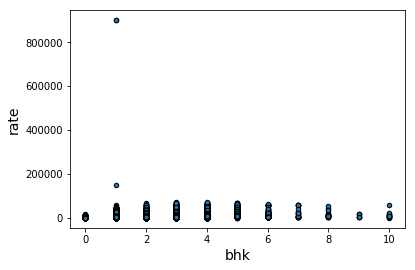

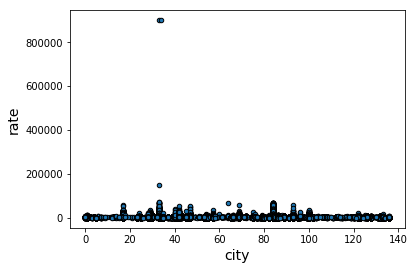

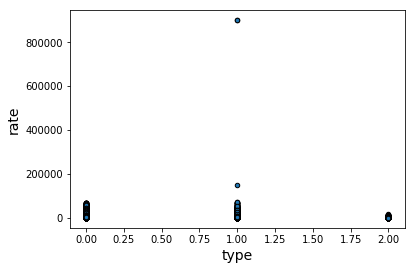

...

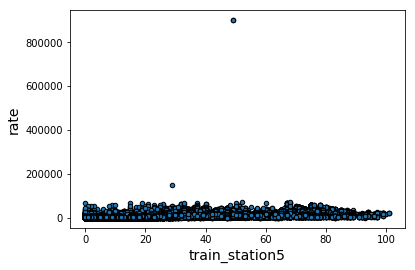

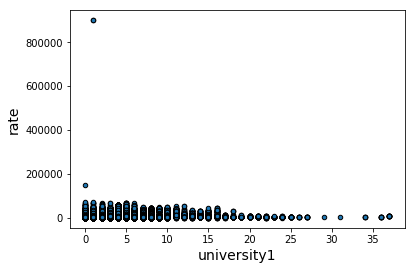

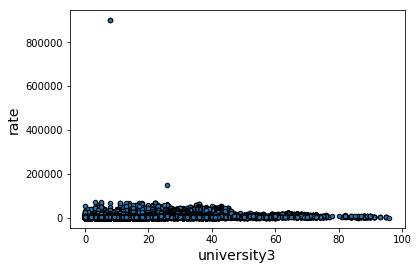

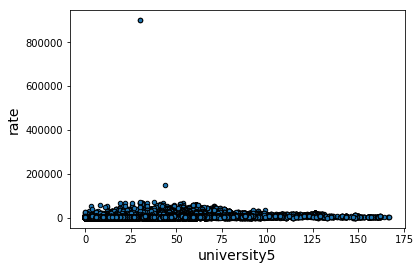

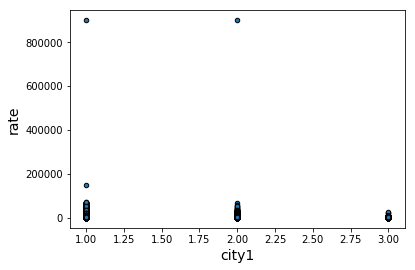

In [12]:
import matplotlib.pyplot as plt
X=df.copy()

Y=X['rate']

del X['rate']

X=NullEncoding(X)
for i in X.columns:

    plt.scatter(X[i], Y, edgecolor='black', s=20)
    plt.xlabel(i, fontsize=14)
    plt.ylabel("rate", fontsize=14)
    plt.show()

C:\Users\Ankit\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  


(213321, 71)

C:\Users\Ankit\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  del sys.path[0]


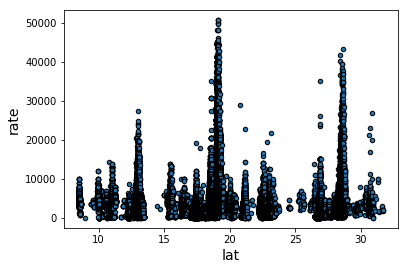

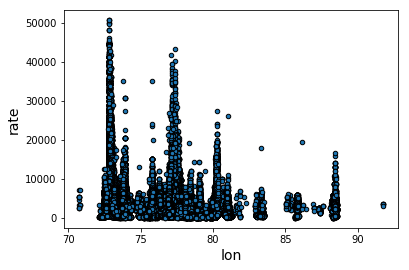

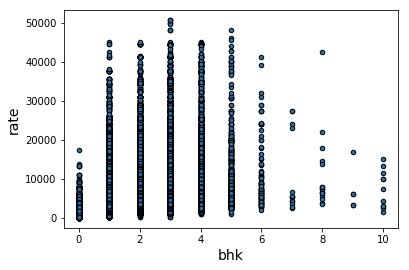

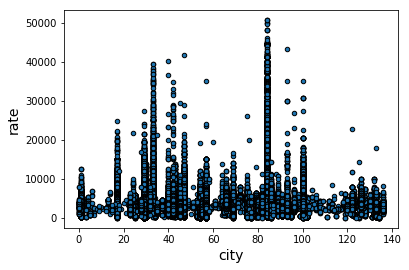

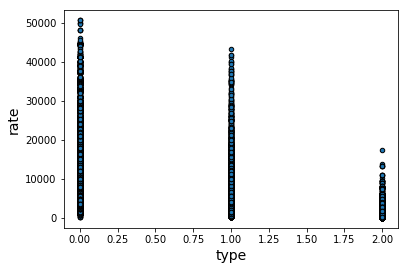

...

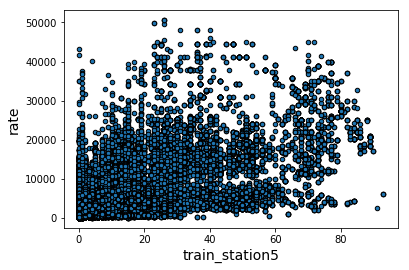

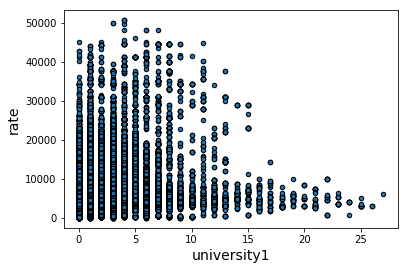

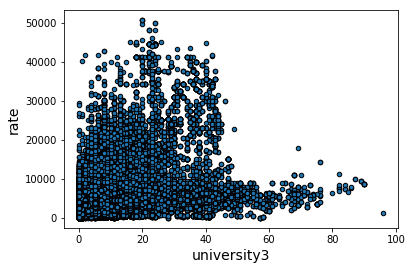

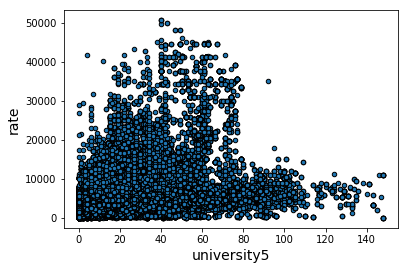

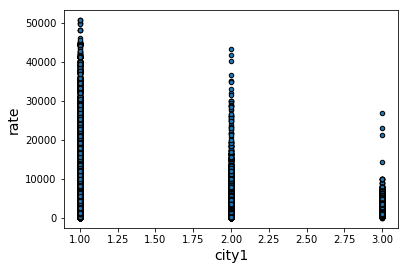

In [21]:
#plot for all without outlier :::
#EllipticEnvelope
import matplotlib.pyplot as plt
df1=EllipticEnvelope(df)
df.shape
X=df1.copy()

Y=X['rate']

del X['rate']

X=NullEncoding(X)

for i in X.columns:

    plt.scatter(X[i], Y, edgecolor='black', s=20)
    plt.xlabel(i, fontsize=14)
    plt.ylabel("rate", fontsize=14)
    plt.show()

In [14]:
def EllipticEnvelope(df1):
    
    from sklearn.covariance import EllipticEnvelope
    i1=EllipticEnvelope().fit(df1).predict(df1)
    
    
    
    d=dict(zip(df1.index,i1))
    index1=[i for i in d.keys() if d[i]==1 ]
   
   
    
    df1=df1.ix[sorted(list(set(index1)))]
    return df1

C:\Users\Ankit\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  del sys.path[0]


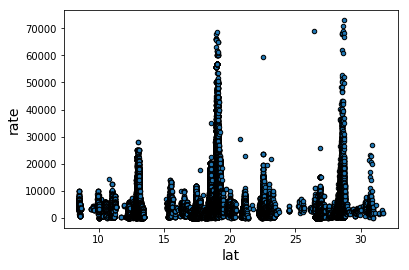

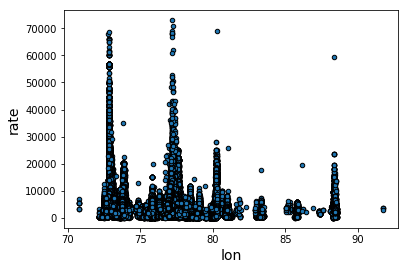

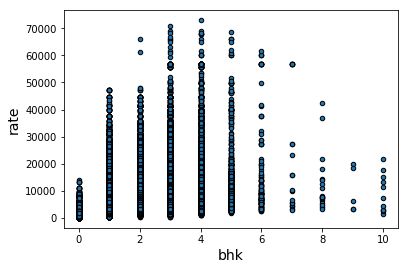

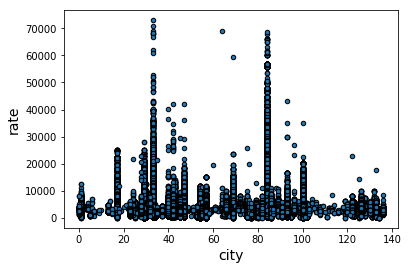

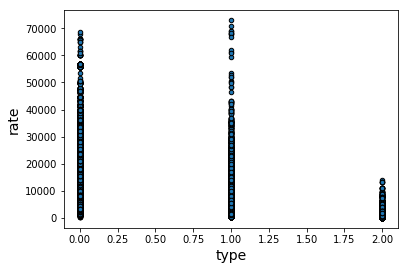

...

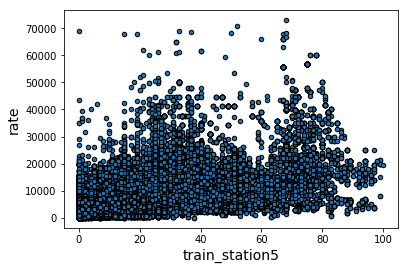

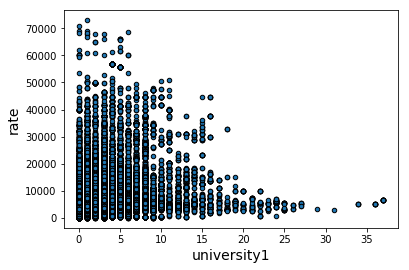

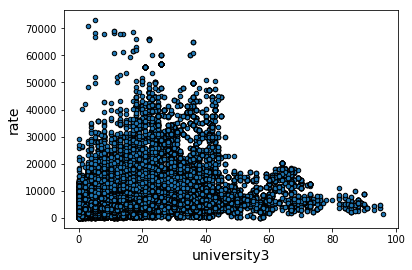

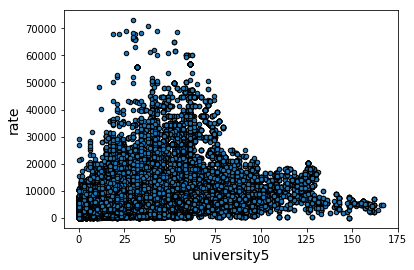

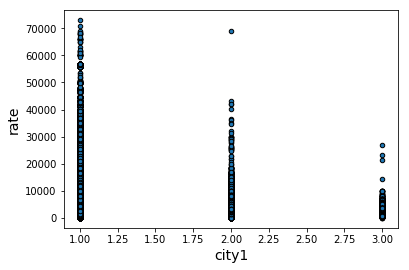

In [19]:
#plot for all without outlier   :::: LocalOutlierFactor
import matplotlib.pyplot as plt
df2=LocalOutlierFactor(df)
df.shape
X=df2.copy()

Y=X['rate']

del X['rate']

X=NullEncoding(X)

for i in X.columns:

    plt.scatter(X[i], Y, edgecolor='black', s=20)
    plt.xlabel(i, fontsize=14)
    plt.ylabel("rate", fontsize=14)
    plt.show()

In [16]:
def LocalOutlierFactor(df1):
    
    
    from sklearn.neighbors import LocalOutlierFactor
    i2=LocalOutlierFactor().fit_predict(df1)
    
    
    d=dict(zip(df1.index,i2))
    index2=[i for i in d.keys() if d[i]==1 ]
   
    
    df1=df1.ix[sorted(list(set(index2)))]
    return df1

C:\Users\Ankit\Anaconda3\lib\site-packages\ipykernel_launcher.py:13: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  del sys.path[0]


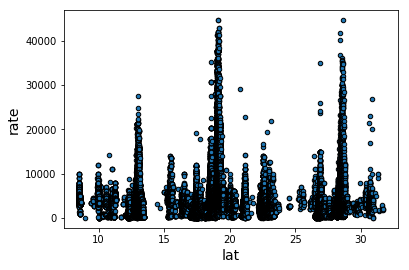

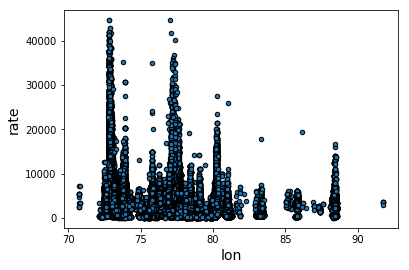

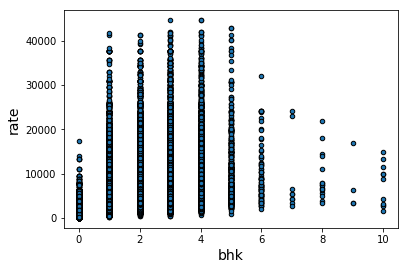

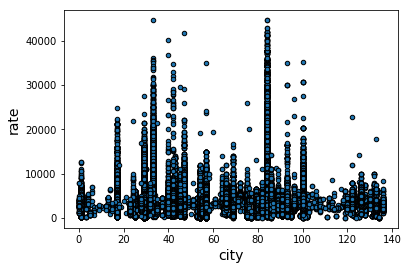

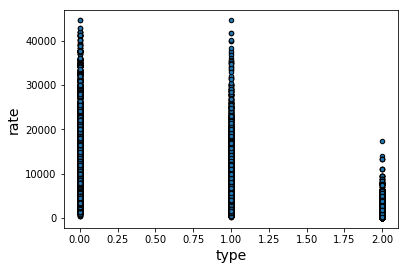

...

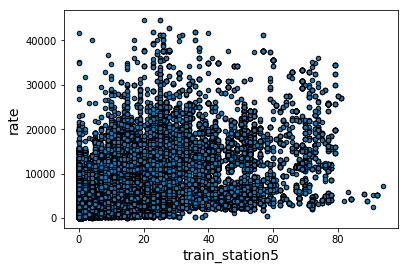

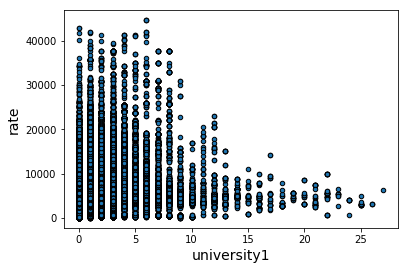

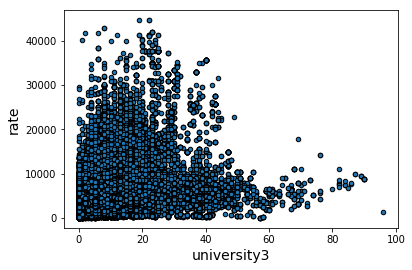

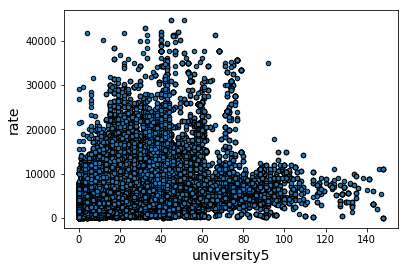

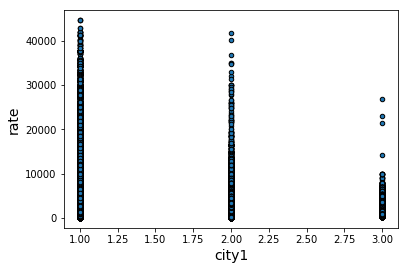

In [20]:
#plot for all without outlier :Custom
import matplotlib.pyplot as plt
df3=EllipticEnvelope(df)
df.shape
X=df3.copy()

Y=X['rate']
del X['rate']

X=NullEncoding(X)

for i in X.columns:
    filtered = reject_outliers(X[i])
    plt.scatter(X[i], Y, edgecolor='black', s=20)
    plt.xlabel(i, fontsize=14)
    plt.ylabel("rate", fontsize=14)
    plt.show()

In [6]:
def reject_outliers(data):
    u = np.median(data)
    s = np.std(data)
    filtered = [e for e in data if (u - 2 * s < e < u + 2 * s)]
    return filtered

In [7]:
def NullEncoding(df2):
      numCols=[]
      for i in df2.columns:
        if df2[i].dtypes=='int64' or df2[i].dtypes=='float64':
            
               #if np.corrcoef(df2[i],target)[0][1]>.1:
               numCols.append(i)
              
      
      #categorical
      StringCol=[]
      for i in df2.columns:
          if df2[i].dtypes!='int64' and df2[i].dtypes!='float64':
              df2[i]=df2[i].apply(str)
              le=preprocessing.LabelEncoder().fit(df2[i])
              df2[i] =le.transform(df2[i])
              pd.to_numeric(df2[i]).astype(np.float)
              StringCol.append(i)
      final=StringCol+numCols
    
      df2=df2.dropna(axis=0)
      return df2